In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/17067), 15.68 MiB | 16.14 MiB/s, done.
Resolving deltas: 100% (11714/11714), done.
/content/yolov5


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 41.2 MB/s eta 0:00:00
Setup complete. Using torch 2.5.1+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40, uuid=559c7a7c-396a-d754-f56d-a816872491a5, L2_cache_size=4MB)


In [ ]:
pwd

'/content/yolov5'

In [ ]:
%cd /content

/content


In [ ]:
import gdown
url ="https://drive.google.com/file/d/1cYCv07SNT-LkI839StJcXDhFQuqGVOJP/view?usp=sharing"

file_id = url.split("/")[-2]
print(file_id)
prefix = 'https://drive.google.com/uc?export=download&id='

gdown.download(prefix+file_id)
print("Data downloaded !")



1cYCv07SNT-LkI839StJcXDhFQuqGVOJP


Downloading...
From (original): https://drive.google.com/uc?export=download&id=1cYCv07SNT-LkI839StJcXDhFQuqGVOJP
From (redirected): https://drive.google.com/uc?export=download&id=1cYCv07SNT-LkI839StJcXDhFQuqGVOJP&confirm=t&uuid=71b09bc8-6b4a-40e5-aa99-cb2c91a3af87
To: /content/FINAL_WASTE.zip
100%|██████████| 401M/401M [00:13<00:00, 30.8MB/s]

Data downloaded !


In [ ]:
!unzip FINAL_WASTE.zip
!rm -rf FINAL_WASTE.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/images/img_00416.jpg  
  inflating: train/images/img_00417.jpg  
  inflating: train/images/img_00418.jpg  
  inflating: train/images/img_00419.jpg  
  inflating: train/images/img_00420.jpg  
  inflating: train/images/img_00421.jpg  
  inflating: train/images/img_00422.jpg  
  inflating: train/images/img_00423.jpg  
  inflating: train/images/img_00424.jpg  
  inflating: train/images/img_00425.jpg  
  inflating: train/images/img_00426.jpg  
  inflating: train/images/img_00427.jpg  
  inflating: train/images/img_00428.jpg  
  inflating: train/images/img_00429.jpg  
  inflating: train/images/img_00430.jpg  
  inflating: train/images/img_00431.jpg  
  inflating: train/images/img_00432.jpg  
  inflating: train/images/img_00433.jpg  
  inflating: train/images/img_00434.jpg  
  inflating: train/images/img_00435.jpg  
  inflating: train/images/img_00436.jpg  
  inflating: train/images/img_00437.jpg  
  inflating: train/images

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 9
names: ['battery','cloth', 'e-waste', 'glass','lightbulb', 'metal', 'organic', 'paper', 'plastic']


In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])


In [ ]:
num_classes


'9'

In [ ]:
#Model configuration
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [ ]:
# train yolov5s on custom data for 1000 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 512 --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache


Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      43/49      2.97G    0.04049    0.02975    0.02464         66        512:  56% 216/384 [00:52<00:54,  3.10it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      43/49      2.97G    0.04049    0.02972    0.02467         56        512:  57% 217/384 [00:52<00:51,  3.22it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      43/49      2.97G    0.04051    0.02977    0.02465         71        512:  57% 218/384 [00:53<00:52,  3.14it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

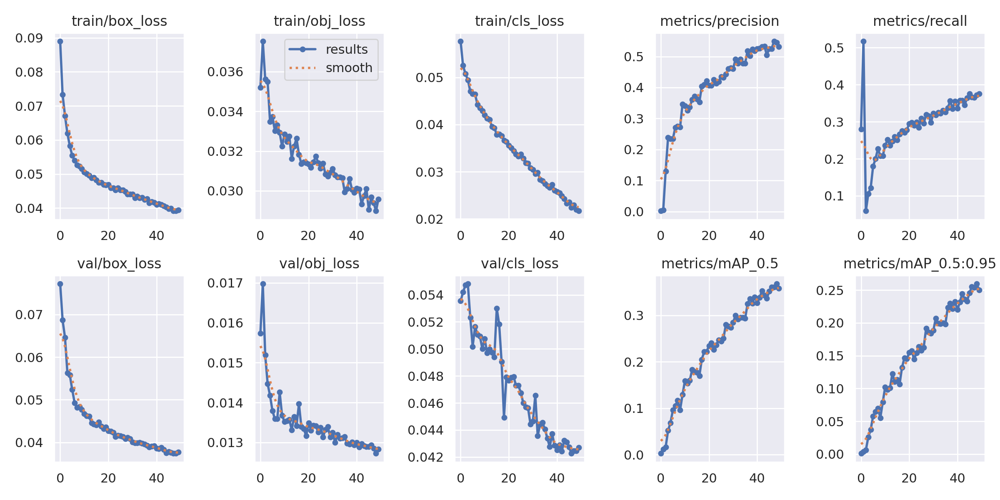

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


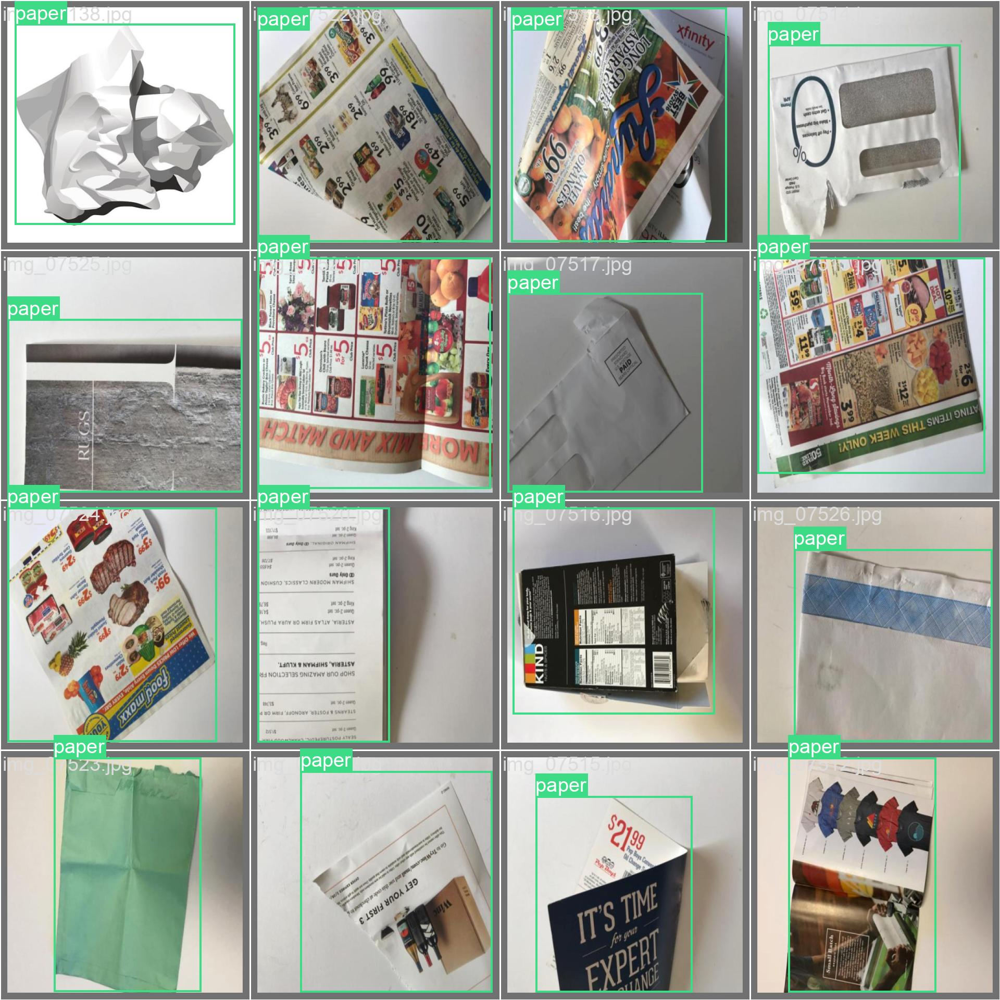

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


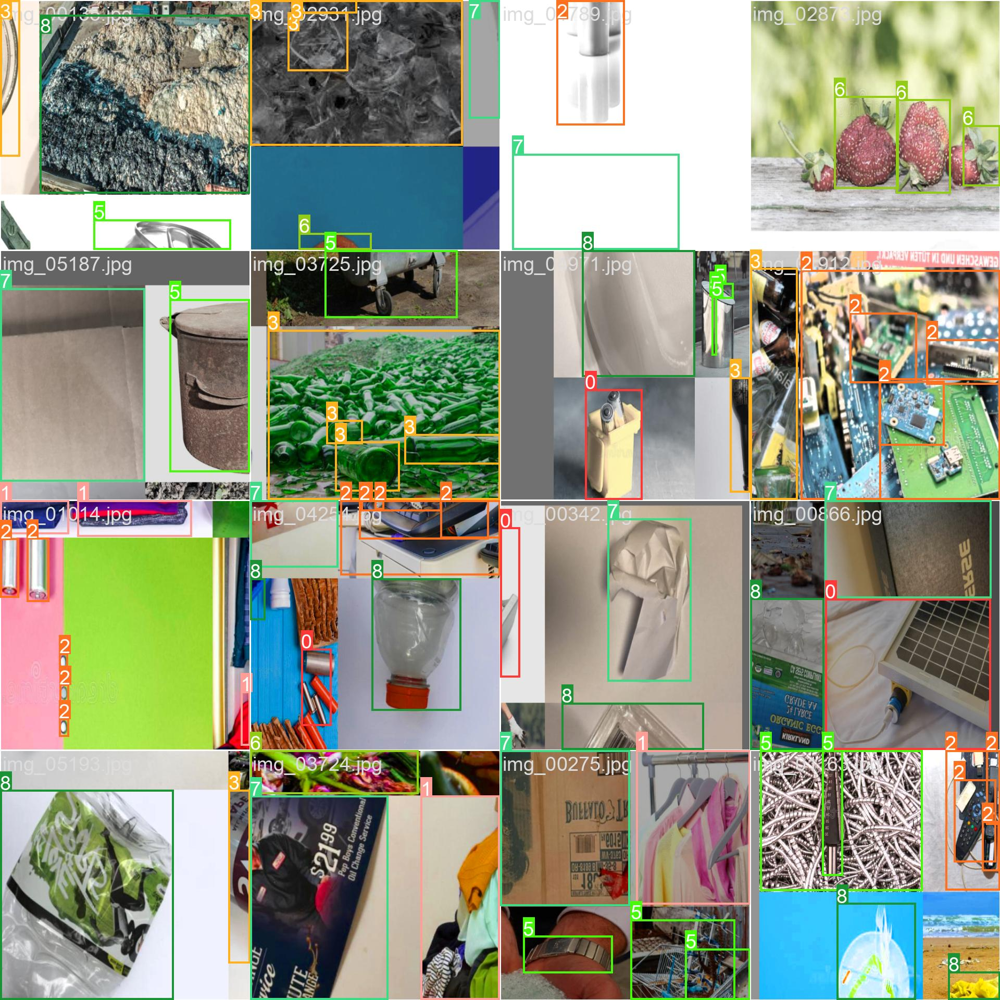

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source ../valid/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7268094 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/2069 /content/valid/images/img_06138.jpg: 416x416 1 paper, 7.7ms
image 2/2069 /content/valid/images/img_06139.jpg: 416x416 1 paper, 7.8ms
image 3/2069 /content/valid/images/img_06140.jpg: 416x416 (no detections), 7.7ms
image 4/2069 /content/vali

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/Research/FINAL_WASTE/model

In [ ]:
!pip install gradio  # For interactive UI
!git clone https://github.com/ultralytics/yolov5  # Cloning YOLOv5 repo
%cd yolov5
!pip install -r requirements.txt  # Installing YOLOv5 requirements


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 117.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 13.2 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/170

In [ ]:
!git clone https://github.com/ultralytics/yolov5
!cd yolov5 && pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/17067), 15.68 MiB | 16.70 MiB/s, done.
Resolving deltas: 100% (11719/11719), done.


In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)


/usr/local/lib/python3.10/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 381MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoSha

In [ ]:
import torch
# Load YOLOv5 model with your custom trained weights (best.pt)
model_path = '/content/yolov5/runs/train/yolov5s_results/weights/best.pt'  # Path to your trained model weights
model = torch.hub.load('ultralytics/yolov5:v7.0', 'custom',
                       path=model_path, force_reload=True)  # Load custom model

# Set model to evaluation mode
model.eval()  # Set to evaluation mode for inference


Downloading: "https://github.com/ultralytics/yolov5/zipball/v7.0" to /root/.cache/torch/hub/v7.0.zip
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 


requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.


custom_YOLOv5s summary: 182 layers, 7268094 parameters, 0 gradients
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Focus(
          (conv): Conv(
            (conv): Conv2d(12, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (act): SiLU(inplace=True)
          )
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): BottleneckCSP(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (cv3): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (cv4): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=

In [ ]:
import gradio as gr
import torch
import cv2
from pathlib import Path
import numpy as np

# Load YOLOv5 model with your custom trained weights (best.pt)
model_path = '/content/yolov5/runs/train/yolov5s_results/weights/best.pt'  # Path to your trained model weights
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load YOLOv5 custom model using torch.hub
model = torch.hub.load('ultralytics/yolov5:v7.0', 'custom', path=model_path, force_reload=True)
model.eval()  # Set model to evaluation mode for inference

# Define a function to handle image input
def detect_objects(image):
    # Convert the image to a format compatible with YOLOv5
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (640, 640))  # Resize for YOLOv5 model input size

    # Run inference on the image
    results = model(img_resized)  # Perform inference

    # Render the results (draw bounding boxes)
    img_with_boxes = results.render()[0]  # The render() function draws boxes on the image

    return img_with_boxes  # Return the image with detections

# Create a Gradio interface for live detection and image upload
iface = gr.Interface(
    fn=detect_objects,
    inputs=gr.Image(type="numpy", label="Upload Image"),  # Updated here
    outputs=gr.Image(type="numpy", label="Detection Output"),  # Updated here
    live=True
)

# Launch the Gradio app
iface.launch()


Downloading: "https://github.com/ultralytics/yolov5/zipball/v7.0" to /root/.cache/torch/hub/v7.0.zip
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 


requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.


custom_YOLOv5s summary: 182 layers, 7268094 parameters, 0 gradients
Adding AutoShape... 


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e594641d0d896b5d34.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import torch

# Load the model
model_path = "/content/yolov5/runs/train/yolov5s_results/weights/best.pt"
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/gdrive/MyDrive/Research/FINAL_WASTE/model/best.pt')


# Print class names
print("Classes:", model.names)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7268094 parameters, 0 gradients
Adding AutoShape... 


Classes: {0: 'battery', 1: 'cloth', 2: 'e-waste', 3: 'glass', 4: 'lightbulb', 5: 'metal', 6: 'organic', 7: 'paper', 8: 'plastic'}
